In [1]:
import pandas as pd
import plotly.express as px
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial.distance import cdist

In [2]:
df=pd.read_csv('machine_temperature_system_failure.csv')

In [3]:
df.head()

,timestamp,value
0,2013-12-02 21:15:00,73.967322
1,2013-12-02 21:20:00,74.935882
2,2013-12-02 21:25:00,76.124162
3,2013-12-02 21:30:00,78.140707
4,2013-12-02 21:35:00,79.329836


In [4]:
def fahrenheit_to_celsius(f):
    return (f - 32) * 5/9

df['value'] = df['value'].apply(fahrenheit_to_celsius)

In [5]:
df.head()

,timestamp,value
0,2013-12-02 21:15:00,23.315179
1,2013-12-02 21:20:00,23.853268
2,2013-12-02 21:25:00,24.513423
3,2013-12-02 21:30:00,25.633726
4,2013-12-02 21:35:00,26.294353


- Temperature sensor data of an internal component of a large, industrial mahcine. The first anomaly is a planned shutdown of the machine. The second anomaly is difficult to detect and
directly led to the third anomaly, a catastrophic failure of the machine.

- Timestamp: Marks the specific date and time the temperature reading was taken. It's in the format YYYY-MM-DD HH:MM:SS.

- It includes at least one planned shutdown of the machine, providing a clear example of a non-critical anomaly.
- There's a less obvious anomaly that precedes a catastrophic machine failure, offering a real-world example of how subtle changes in sensor data can herald significant issues.

In [6]:
df['timestamp'] = pd.to_datetime(df['timestamp'])

In [7]:
# Function to determine part of the day
def part_of_day(hour):
    if 6 <= hour < 18:
        return 'Day'
    else:
        return 'Night'

In [8]:
# Function to determine the season
def season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Fall'

In [9]:
df['part_of_day'] = df['timestamp'].apply(lambda x: part_of_day(x.hour))
df['month'] = df['timestamp'].dt.month
df['season'] = df['month'].apply(season)
df['weekday'] = df['timestamp'].dt.weekday.apply(lambda x: 'Weekend' if x > 4 else 'Weekday')
df['hour'] = df['timestamp'].dt.hour

In [10]:
df.sort_values('timestamp', inplace=True)

In [11]:
df.head()

,timestamp,value,part_of_day,month,season,weekday,hour
0,2013-12-02 21:15:00,23.315179,Night,12,Winter,Weekday,21
1,2013-12-02 21:20:00,23.853268,Night,12,Winter,Weekday,21
2,2013-12-02 21:25:00,24.513423,Night,12,Winter,Weekday,21
3,2013-12-02 21:30:00,25.633726,Night,12,Winter,Weekday,21
4,2013-12-02 21:35:00,26.294353,Night,12,Winter,Weekday,21


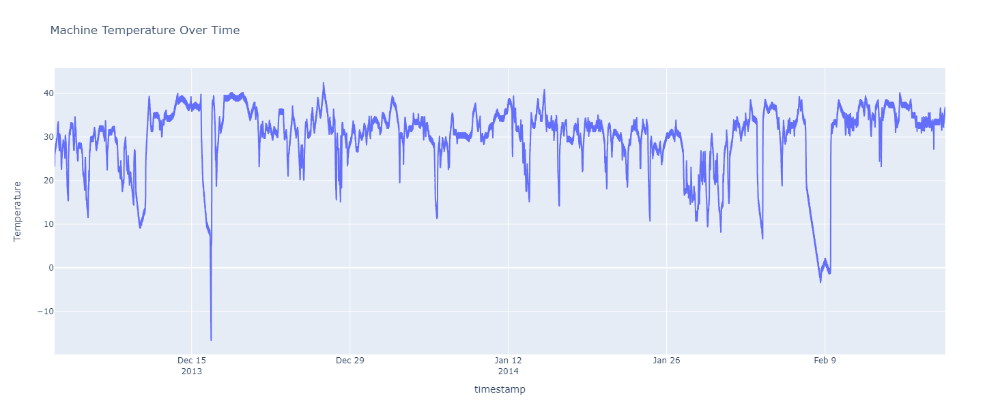

In [12]:
fig = px.line(df, x='timestamp', y='value', title='Machine Temperature Over Time',
              labels={'value': 'Temperature', 'timestamp_str': 'Timestamp'})

fig.update_layout(width=1000, height=600)
fig.show()

In [13]:
### Z score 

In [14]:
df['mean'] = df['value'].mean()
df['std'] = df['value'].std()
df['z_score'] = (df['value'] - df['mean']) / df['std']
thresholds = [1, 2, 3, 4, 5]

In [15]:
# Creating a dictionary to store anomalies for each threshold level and iterating through thresholds
anomalies_dict = {}
for threshold in thresholds:
    df[f'Anomaly_{threshold}'] = (df['z_score'].abs() > threshold).astype(int)
    anomalies_dict[threshold] = df[f'Anomaly_{threshold}']

In [16]:
# Creating an 'Anomaly_Level' column to see which threshold level detected the anomaly
df['Anomaly_Level_Z'] = df.apply(lambda row: max((threshold for threshold, value in anomalies_dict.items() if row[f'Anomaly_{threshold}']), default=0), axis=1)
df.drop(columns=['mean', 'std', 'Anomaly_1', 'Anomaly_2', 'Anomaly_3', 'Anomaly_4', 'Anomaly_5', 'z_score'], inplace=True)


- Applying Z-score for anomaly detection in a time series context should be approached with caution. While Z-score is effective for identifying outliers in a stationary dataset, time series data often exhibit trends, seasonality, and cycles that can affect the applicability of standard Z-score calculations

In [17]:
df[df['Anomaly_Level_Z']==5].head()

,timestamp,value,part_of_day,month,season,weekday,hour,Anomaly_Level_Z
3978,2013-12-16 16:45:00,-8.634940,Day,12,Winter,Weekday,16,5
3979,2013-12-16 16:50:00,-9.627189,Day,12,Winter,Weekday,16,5
3980,2013-12-16 16:55:00,-10.881060,Day,12,Winter,Weekday,16,5
3981,2013-12-16 17:00:00,-12.425582,Day,12,Winter,Weekday,17,5
3982,2013-12-16 17:05:00,-12.221130,Day,12,Winter,Weekday,17,5


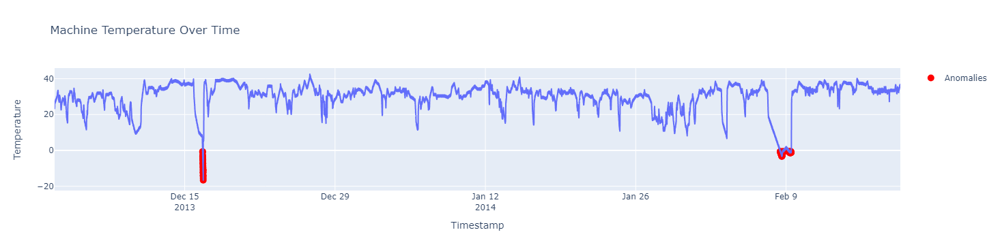

In [18]:

fig = px.line(df, x='timestamp', y='value', title='Machine Temperature Over Time',
              labels={'value': 'Temperature', 'timestamp': 'Timestamp'})
anomalies = df[(df['Anomaly_Level_Z'] == 5) | (df['Anomaly_Level_Z'] == 4)]

fig.add_scatter(x=anomalies['timestamp'], y=anomalies['value'], mode='markers', 
                marker=dict(color='red', size=10), name='Anomalies')
fig.show()

In [19]:
df.drop(columns='Anomaly_Level_Z', axis=1, inplace=True)

## K- means

In [20]:
df.head()

,timestamp,value,part_of_day,month,season,weekday,hour
0,2013-12-02 21:15:00,23.315179,Night,12,Winter,Weekday,21
1,2013-12-02 21:20:00,23.853268,Night,12,Winter,Weekday,21
2,2013-12-02 21:25:00,24.513423,Night,12,Winter,Weekday,21
3,2013-12-02 21:30:00,25.633726,Night,12,Winter,Weekday,21
4,2013-12-02 21:35:00,26.294353,Night,12,Winter,Weekday,21


In [21]:
for col in ['part_of_day', 'season', 'weekday']:
    df[col] = preprocessing.LabelEncoder().fit_transform(df[col])
min_max_scaler = preprocessing.StandardScaler()
np_scaled = min_max_scaler.fit_transform(df.select_dtypes(include=[np.number]))
df_scaled = pd.DataFrame(np_scaled)

In [22]:
pca = PCA(n_components=2)
data_pca = pca.fit_transform(df_scaled)
np_scaled = min_max_scaler.fit_transform(data_pca)
df_final = pd.DataFrame(np_scaled)

n_cluster = range(1, 20)
kmeans = [KMeans(n_clusters=i).fit(df_final) for i in n_cluster]
scores = [kmeans[i].score(df_final) for i in range(len(kmeans))]
fig, ax = plt.subplots()
ax.plot(n_cluster, scores)
ax.set_xlabel('Number of Clusters')
ax.set_ylabel('Score')
ax.set_title('Elbow Method for Optimal Number of Clusters')
plt.show()


- it appears that the score begins to flatten after 5 clusters. So, typically, you would choose 5 as the optimal number of clusters for your dataset. 

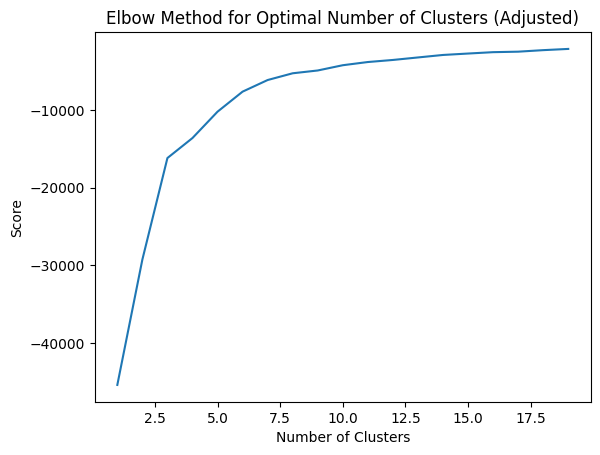

In [23]:
n_cluster =  range(1, 20) 
kmeans = [KMeans(n_clusters=i).fit(df_final) for i in n_cluster]
scores = [kmeans[i].score(df_final) for i in range(len(kmeans))]
fig, ax = plt.subplots()
ax.plot(n_cluster, scores)
ax.set_xlabel('Number of Clusters')
ax.set_ylabel('Score')
ax.set_title('Elbow Method for Optimal Number of Clusters (Adjusted)')
plt.show()

In [24]:
df['cluster'] = kmeans[4].predict(df_final) 
df['principal_feature1'] = data_pca[:, 0]
df['principal_feature2'] = data_pca[:, 1]
cluster_counts = df['cluster'].value_counts()

### English
-As we choose the 5 clusters, the K-means index should be 4
### German 
-Da wir die 5 Cluster auswählen, sollte der K-Means-Index 4 sein

In [25]:
cluster_counts

cluster
0    6963
2    5949
1    5202
4    2695
3    1886
Name: count, dtype: int64

- Each number indicates how many data points have been grouped into the respective cluster. It looks like Cluster 0 is the largest, suggesting that many data points share similar characteristics that have been recognized by the clustering algorithm. Cluster 2 is the smallest, implying fewer data points have the combination of features that define this cluster.

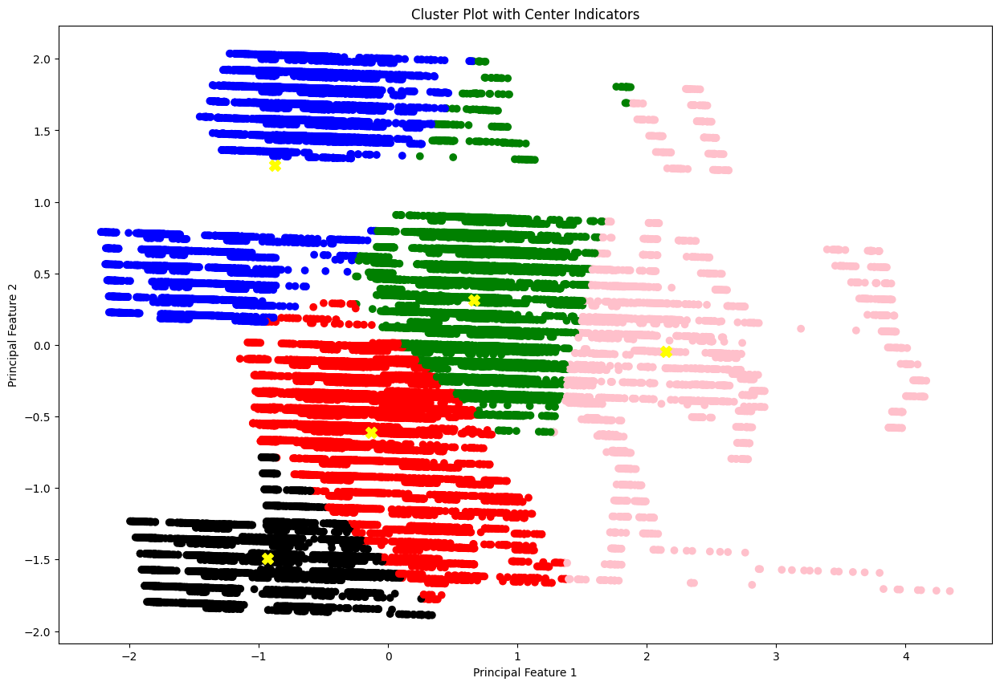

In [26]:
fig, ax = plt.subplots()
colors = {0: 'red', 1: 'blue', 2: 'green', 3: 'pink', 4: 'black'}

# Scatter plot for clusters
ax.scatter(df['principal_feature1'], df['principal_feature2'], c=df['cluster'].apply(lambda x: colors[x]))

# We will also plot the cluster centers
cluster_centers = kmeans[4].cluster_centers_
ax.scatter(cluster_centers[:, 0], cluster_centers[:, 1], c='yellow', s=100, marker='X')  # cluster centers marked with 'X'

# Setting title and labels
ax.set_title('Cluster Plot with Center Indicators')
ax.set_xlabel('Principal Feature 1')
ax.set_ylabel('Principal Feature 2')
from matplotlib.pyplot import figure

fig.set_size_inches(15, 10)

plt.show()

### Based on visual inspection of the scatter plot, the potential anomalies could be:
- Points that are isolated from others, significantly far from the main distribution of their cluster.
- Points that lie between the clusters but do not seem to belong to any of them due to their distance from the cluster centers.
- Points that are located at the periphery of the clusters if the clusters are supposed to be dense and well-defined.


In [27]:
def getDistanceByPoint(data, model):
    distance = pd.Series()
    for i in range(0,len(data)):
        Xa = np.array(data.loc[i])
        Xb = model.cluster_centers_[model.labels_[i]-1]
        distance.set_value(i, np.linalg.norm(Xa-Xb))
    return distance

In [28]:
outliers_fraction = 0.05  # for example, we consider 5% of the dataset as outliers
distances = cdist(df_final, kmeans[4].cluster_centers_, 'euclidean')
min_distances = np.min(distances, axis=1)
distance_series = pd.Series(min_distances)
number_of_outliers = int(outliers_fraction * len(distance_series))
threshold = distance_series.nlargest(number_of_outliers).min()
df['anomaly_Kmeans'] = (distance_series >= threshold).astype(int)
df[['anomaly_Kmeans', 'principal_feature1', 'principal_feature2']].head()

,anomaly_Kmeans,principal_feature1,principal_feature2
0,0,-0.411166,-1.613230
1,0,-0.460659,-1.611817
2,0,-0.521378,-1.610084
3,0,-0.624421,-1.607144
4,0,-0.685184,-1.605410


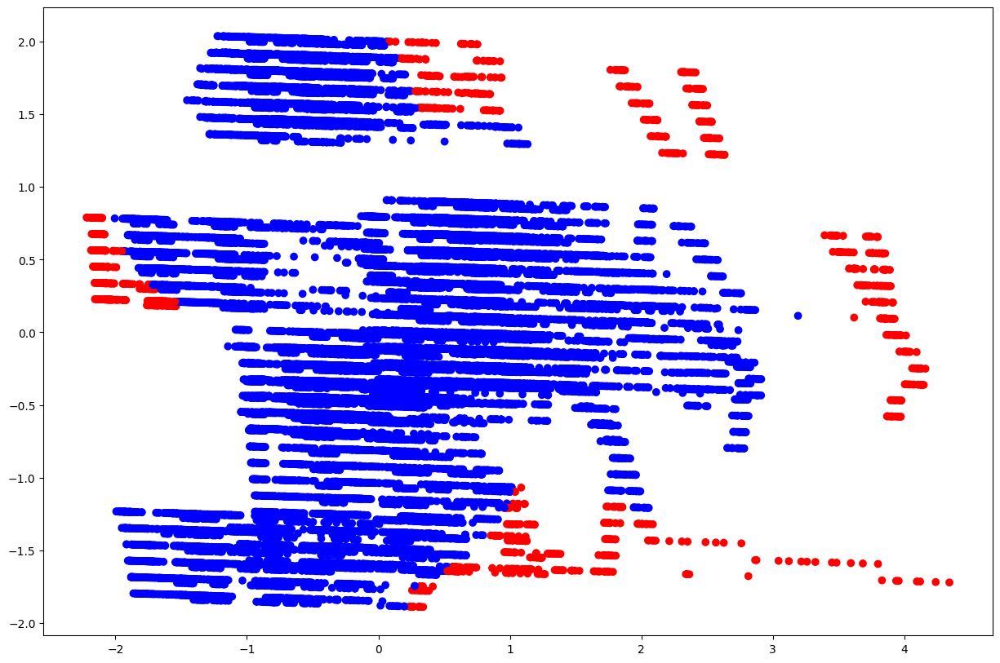

In [29]:
fig, ax = plt.subplots()
colors = {0:'blue', 1:'red'}
ax.scatter(df['principal_feature1'], df['principal_feature2'], c=df["anomaly_Kmeans"].apply(lambda x: colors[x]))
fig.set_size_inches(15, 10)
plt.show()

In [30]:
df.head()

,timestamp,value,part_of_day,month,season,weekday,hour,cluster,principal_feature1,principal_feature2,anomaly_Kmeans
0,2013-12-02 21:15:00,23.315179,1,12,0,0,21,4,-0.411166,-1.613230,0
1,2013-12-02 21:20:00,23.853268,1,12,0,0,21,4,-0.460659,-1.611817,0
2,2013-12-02 21:25:00,24.513423,1,12,0,0,21,4,-0.521378,-1.610084,0
3,2013-12-02 21:30:00,25.633726,1,12,0,0,21,4,-0.624421,-1.607144,0
4,2013-12-02 21:35:00,26.294353,1,12,0,0,21,4,-0.685184,-1.605410,0


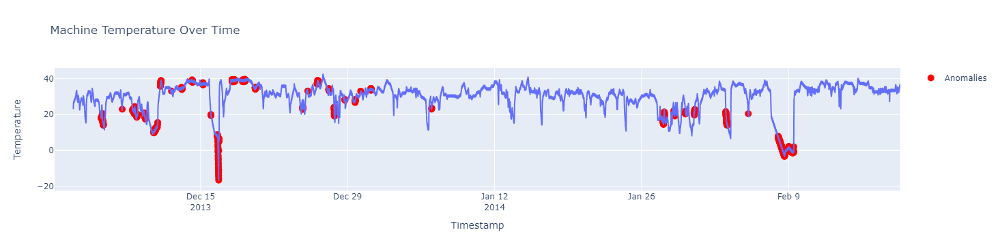

In [31]:
fig = px.line(df, x='timestamp', y='value', title='Machine Temperature Over Time',
              labels={'value': 'Temperature', 'timestamp': 'Timestamp'})
anomalies = df[df['anomaly_Kmeans'] == 1]
fig.add_scatter(x=anomalies['timestamp'], y=anomalies['value'], mode='markers', 
                marker=dict(color='red', size=10), name='Anomalies')

fig.show()

In [32]:
### Isolation Forest

In [33]:
from sklearn.ensemble import IsolationForest

In [34]:
data = df[['value', 'part_of_day', 'month', 'season', 'weekday', 'hour']]

In [35]:
min_max_scaler = preprocessing.StandardScaler()
np_scaled = min_max_scaler.fit_transform(data)
data = pd.DataFrame(np_scaled)

In [36]:
# train isolation forest 
model =  IsolationForest(contamination = outliers_fraction)
model.fit(data)

IsolationForest(contamination=0.05)

In [37]:
# add the data to the main  
df['anomaly_Isolation_Forest'] = pd.Series(model.predict(data))
df['anomaly_Isolation_Forest'] = df['anomaly_Isolation_Forest'].map( {1: 0, -1: 1} )
print(df['anomaly_Isolation_Forest'].value_counts())

anomaly_Isolation_Forest
0    21560
1     1135
Name: count, dtype: int64


In [38]:
df.head()

,timestamp,value,part_of_day,month,season,weekday,hour,cluster,principal_feature1,principal_feature2,anomaly_Kmeans,anomaly_Isolation_Forest
0,2013-12-02 21:15:00,23.315179,1,12,0,0,21,4,-0.411166,-1.613230,0,0
1,2013-12-02 21:20:00,23.853268,1,12,0,0,21,4,-0.460659,-1.611817,0,0
2,2013-12-02 21:25:00,24.513423,1,12,0,0,21,4,-0.521378,-1.610084,0,0
3,2013-12-02 21:30:00,25.633726,1,12,0,0,21,4,-0.624421,-1.607144,0,0
4,2013-12-02 21:35:00,26.294353,1,12,0,0,21,4,-0.685184,-1.605410,0,0


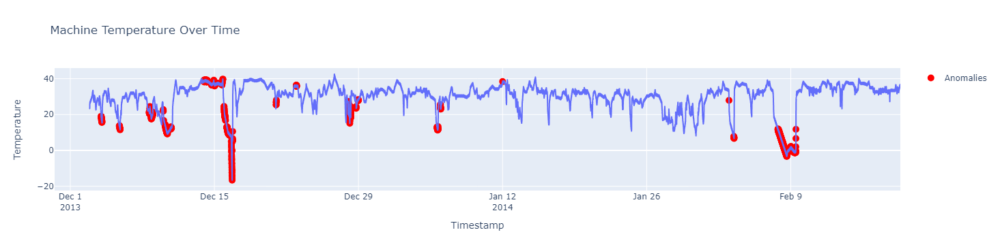

In [39]:
fig = px.line(df, x='timestamp', y='value', title='Machine Temperature Over Time',
              labels={'value': 'Temperature', 'timestamp': 'Timestamp'})
anomalies = df[df['anomaly_Isolation_Forest'] == 1]
fig.add_scatter(x=anomalies['timestamp'], y=anomalies['value'], mode='markers', 
                marker=dict(color='red', size=10), name='Anomalies')
fig.show()

In [40]:
### K-means and Isolation Forest

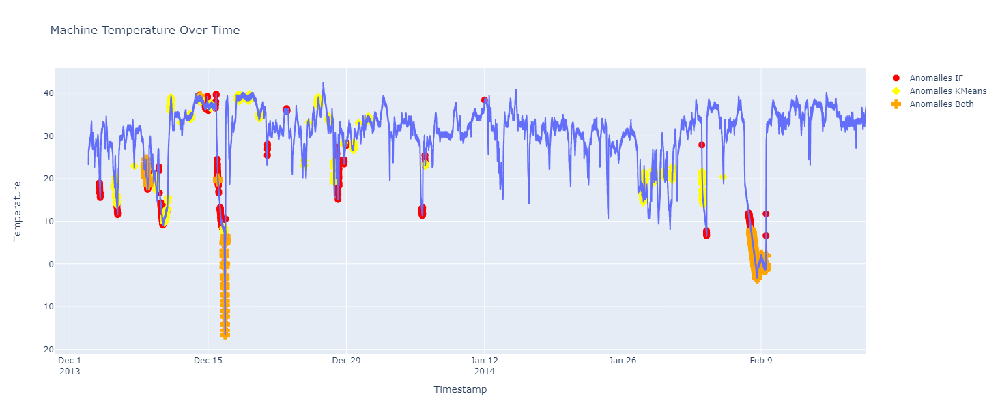

In [41]:

fig = px.line(df, x='timestamp', y='value', title='Machine Temperature Over Time',
              labels={'value': 'Temperature', 'timestamp': 'Timestamp'})
anomalies_if = df[df['anomaly_Isolation_Forest'] == 1]
fig.add_scatter(x=anomalies_if['timestamp'], y=anomalies_if['value'], mode='markers', 
                marker=dict(color='red', size=10, symbol='circle'), name='Anomalies IF')
anomalies_km = df[df['anomaly_Kmeans'] == 1]
fig.add_scatter(x=anomalies_km['timestamp'], y=anomalies_km['value'], mode='markers',
                marker=dict(color='yellow', size=10, symbol='diamond'), name='Anomalies KMeans')
anomalies_both = df[(df['anomaly_Kmeans'] == 1) & (df['anomaly_Isolation_Forest'] == 1)]
fig.add_scatter(x=anomalies_both['timestamp'], y=anomalies_both['value'], mode='markers',
                marker=dict(color='orange', size=12, symbol='cross'), name='Anomalies Both')
fig.update_layout(
    height=600,
    width=1500,
    title_text='Machine Temperature Over Time',
    xaxis_title='Timestamp',
    yaxis_title='Temperature'
)

fig.show()